# Анализ рынка недвижимости в Санкт-Петербурге

В вашем распоряжении данные сервиса Яндекс.Недвижимость — архив объявлений о продаже квартир в Санкт-Петербурге и соседних населённых пунктов за несколько лет. Нужно научиться определять рыночную стоимость объектов недвижимости. Ваша задача — установить параметры. Это позволит построить автоматизированную систему: она отследит аномалии и мошенническую деятельность. 

По каждой квартире на продажу доступны два вида данных. Первые вписаны пользователем, вторые — получены автоматически на основе картографических данных. Например, расстояние до центра, аэропорта, ближайшего парка и водоёма. 

**Цель исследования**:
1. Изучить скорость продажи недвижимости для выявления аномальных значений и мошеннеческих действий.
2. Изучить факторы, влияющие на полную стоимость объектов.
3. Изучить стоимость 1 кв.м. в различных населенных пунктах, выявить различия между ценой в городах и поселках.

**Ход исследования**

О качестве данных ничего не известно. Поэтому перед проведением исследования понадобится обзор данных. 

Необходимо проверить данные на ошибки и пропуски. На этапе предобработки найти возможность исправить критичные пропуски и добавить несколько вспомогательных столбцов.
Таким образом, исследование пройдёт в три этапа:
 1. Обзор данных.
 2. Предобработка данных.
 3. Исследовательский анализ данных.

## Оглавление

<a href='#1'> 1. Изучение общей информации </a>

<a href='#2'> 2. Предобработка данных </a>
- <a href='#3'> 2.1 Изучение пропусков</a>
- <a href='#4'> 2.3 Заполнение пропусков</a>
- <a href='#5'> 2.4 Удаление пропусков</a>
    - <a href='#6'> 2.5 Вывод</a>
- <a href='#7'> 2.6 Изменение типов данных </a>
    - <a href='#8'> 2.7 Вывод </a>
- <a href='#9'> 2.8 Поиск и устранение дубликатов </a>
    - <a href='#10'> 2.9 Вывод </a>
- <a href='#11'> 2.10 Поиск и устранение аномальных значений</a>
    - <a href='#12'> 2.11 Вывод</a>

<a href='#13'> 3. Добавление новых стобцов</a>

<a href='#14'> 4. Исследовательский анализ данных </a>
- <a href='#a'> 4.1 Общая площадь </a>
- <a href='#b'> 4.2 Жилая площадь </a>
- <a href='#c'> 4.3 Площадь кухни </a>
- <a href='#d'> 4.4 Цена объекта </a>
- <a href='#e'> 4.5 Количество комнат </a>
- <a href='#f'> 4.6 Высота потолков </a>
- <a href='#g'> 4.7 Этаж квартиры </a>
- <a href='#h'> 4.8 Количество этажей в доме </a>
- <a href='#i'> 4.9 Тип этажа квартиры </a>
- <a href='#j'> 4.10 Расстояние до центра города </a>
- <a href='#k'> 4.11 Расстояние до ближайшего аэропорта </a>
- <a href='#l'> 4.12 Расстояние до ближайшего парка </a>
- <a href='#m'> 4.13 День публикации </a>
- <a href='#n'> 4.14 Месяц публикации </a>
- <a href='#15'> 4.15 Вывод </a>

<a href='#16'> 5. Срок продажи квартиры </a>

<a href='#17'> 6. Факторы, влияющие на стоимость</a>
- <a href='#18'> 6.1 Вывод </a>

<a href='#19'> 7. Средняя цена 1 кв.м. </a>
- <a href='#20'> 7.1 Вывод </a>

<a href='#21'> 8. Стоимость квартиры в зависимости от расстояния до центра </a>
- <a href='#22'> 8.1 Вывод </a>

<a href='#23'> 9. Общий вывод </a>

**Импорт библиотек**

In [1]:
import pandas as pd
#import numpy as np
#import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.figure_factory as ff

## Изучение общей информации <a id='1'></a>

In [2]:
#импорт датафрейма
df= pd.read_csv('real_estate_data.csv', sep='\t')

#общая информация
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23699 entries, 0 to 23698
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   total_images          23699 non-null  int64  
 1   last_price            23699 non-null  float64
 2   total_area            23699 non-null  float64
 3   first_day_exposition  23699 non-null  object 
 4   rooms                 23699 non-null  int64  
 5   ceiling_height        14504 non-null  float64
 6   floors_total          23613 non-null  float64
 7   living_area           21796 non-null  float64
 8   floor                 23699 non-null  int64  
 9   is_apartment          2775 non-null   object 
 10  studio                23699 non-null  bool   
 11  open_plan             23699 non-null  bool   
 12  kitchen_area          21421 non-null  float64
 13  balcony               12180 non-null  float64
 14  locality_name         23650 non-null  object 
 15  airports_nearest   

In [3]:
# переименование столбца
df = df.rename(columns={'cityCenters_nearest':'city_centers_nearest'})

In [4]:
#первые 5 строчек
df.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,city_centers_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000.0,108.0,2019-03-07T00:00:00,3,2.70,16.0,51.0,8,NaN,...,25.0,NaN,Санкт-Петербург,18863.0,16028.0,1.0,482.0,2.0,755.0,NaN
1,7,3350000.0,40.4,2018-12-04T00:00:00,1,NaN,11.0,18.6,1,NaN,...,11.0,2.0,посёлок Шушары,12817.0,18603.0,0.0,NaN,0.0,NaN,81.0
2,10,5196000.0,56.0,2015-08-20T00:00:00,2,NaN,5.0,34.3,4,NaN,...,8.3,0.0,Санкт-Петербург,21741.0,13933.0,1.0,90.0,2.0,574.0,558.0
3,0,64900000.0,159.0,2015-07-24T00:00:00,3,NaN,14.0,NaN,9,NaN,...,NaN,0.0,Санкт-Петербург,28098.0,6800.0,2.0,84.0,3.0,234.0,424.0
4,2,10000000.0,100.0,2018-06-19T00:00:00,2,3.03,14.0,32.0,13,NaN,...,41.0,NaN,Санкт-Петербург,31856.0,8098.0,2.0,112.0,1.0,48.0,121.0


In [5]:
#последние 5 строчек
df.tail()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,city_centers_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
23694,9,9700000.0,133.81,2017-03-21T00:00:00,3,3.7,5.0,73.3,3,NaN,...,13.83,NaN,Санкт-Петербург,24665.0,4232.0,1.0,796.0,3.0,381.0,NaN
23695,14,3100000.0,59.00,2018-01-15T00:00:00,3,NaN,5.0,38.0,4,NaN,...,8.50,NaN,Тосно,NaN,NaN,NaN,NaN,NaN,NaN,45.0
23696,18,2500000.0,56.70,2018-02-11T00:00:00,2,NaN,3.0,29.7,1,NaN,...,NaN,NaN,село Рождествено,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23697,13,11475000.0,76.75,2017-03-28T00:00:00,2,3.0,17.0,NaN,12,NaN,...,23.30,2.0,Санкт-Петербург,39140.0,10364.0,2.0,173.0,3.0,196.0,602.0
23698,4,1350000.0,32.30,2017-07-21T00:00:00,1,2.5,5.0,12.3,1,NaN,...,9.00,NaN,поселок Новый Учхоз,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
#описание значений датафрейма
df.describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,airports_nearest,city_centers_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
count,23699.000000,2.369900e+04,23699.000000,23699.000000,14504.000000,23613.000000,21796.000000,23699.000000,21421.000000,12180.000000,18157.000000,18180.000000,18181.000000,8079.000000,18181.000000,9110.000000,20518.000000
mean,9.858475,6.541549e+06,60.348651,2.070636,2.771499,10.673824,34.457852,5.892358,10.569807,1.150082,28793.672193,14191.277833,0.611408,490.804555,0.770255,517.980900,180.888634
std,5.682529,1.088701e+07,35.654083,1.078405,1.261056,6.597173,22.030445,4.885249,5.905438,1.071300,12630.880622,8608.386210,0.802074,342.317995,0.938346,277.720643,219.727988
min,0.000000,1.219000e+04,12.000000,0.000000,1.000000,1.000000,2.000000,1.000000,1.300000,0.000000,0.000000,181.000000,0.000000,1.000000,0.000000,13.000000,1.000000
25%,6.000000,3.400000e+06,40.000000,1.000000,2.520000,5.000000,18.600000,2.000000,7.000000,0.000000,18585.000000,9238.000000,0.000000,288.000000,0.000000,294.000000,45.000000
50%,9.000000,4.650000e+06,52.000000,2.000000,2.650000,9.000000,30.000000,4.000000,9.100000,1.000000,26726.000000,13098.500000,0.000000,455.000000,1.000000,502.000000,95.000000
75%,14.000000,6.800000e+06,69.900000,3.000000,2.800000,16.000000,42.300000,8.000000,12.000000,2.000000,37273.000000,16293.000000,1.000000,612.000000,1.000000,729.000000,232.000000
max,50.000000,7.630000e+08,900.000000,19.000000,100.000000,60.000000,409.700000,33.000000,112.000000,5.000000,84869.000000,65968.000000,3.000000,3190.000000,3.000000,1344.000000,1580.000000


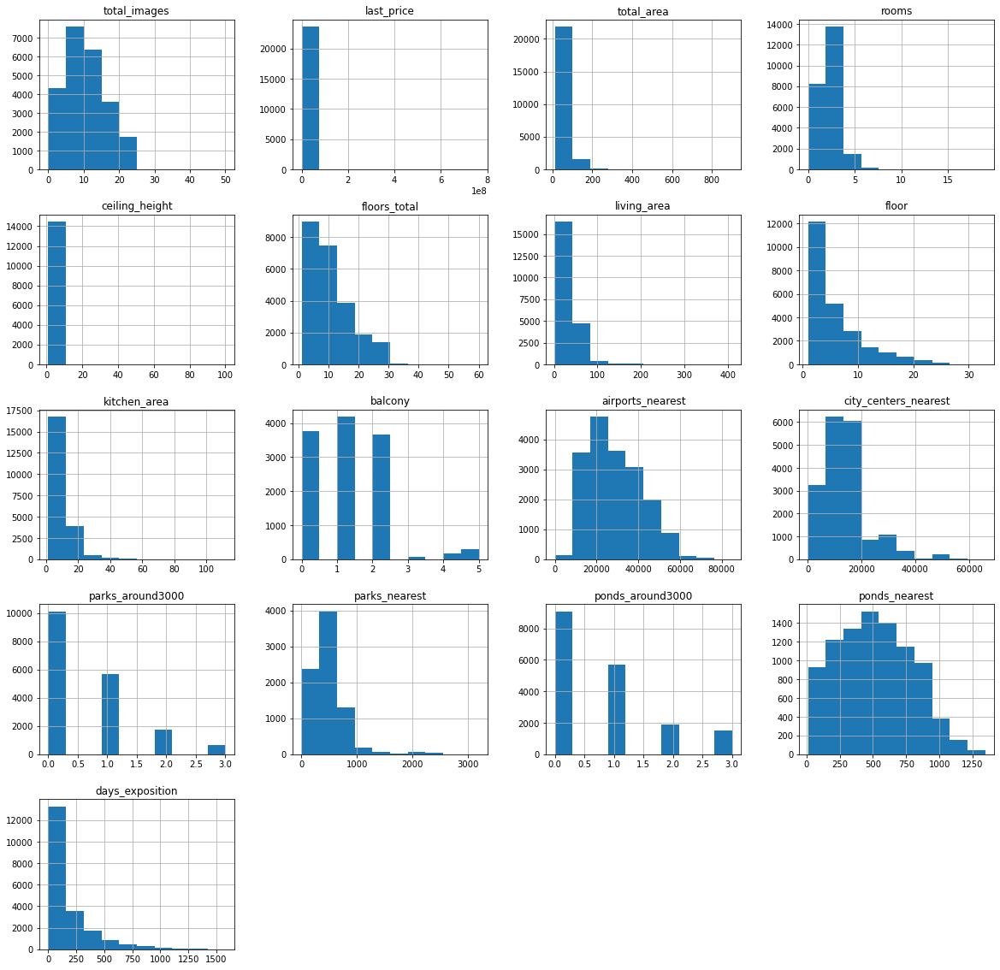

In [7]:
#гистограммы датафрейма
df.hist(figsize=(20, 20));

## Предобработка данных <a id='2'></a>

### Проверка наличия пропусков в датафрейме <a id='3'></a>

In [8]:
#количество пропусков
pd.DataFrame(round(df.isna().mean()*100,)).style.background_gradient('coolwarm')

,0
total_images,0.000000
last_price,0.000000
total_area,0.000000
first_day_exposition,0.000000
rooms,0.000000
ceiling_height,39.000000
floors_total,0.000000
living_area,8.000000
floor,0.000000
is_apartment,88.000000


### **Заполнение и удаление пропусков** <a id='4'></a>

### Заполнение пропусков

In [9]:
#заполнение пропусков в колонке 'balcony'
df['balcony'] = df['balcony'].fillna(0)

In [10]:
#заполнение пустых значений в колонке'is_apartment'
df['is_apartment'] = df['is_apartment'].fillna(False)

In [11]:
#заполнение пустых значений в колонке'parks_around3000'
df['parks_around3000'] = df['parks_around3000'].fillna(0)

In [12]:
#заполнение пустых значений в колонке'parks_around3000'
df['ponds_around3000'] = df['ponds_around3000'].fillna(0)

- **Высота потолков:**

In [13]:
#вычисление медианы высоты потолков в'ceiling_height'
median_height = df['ceiling_height'].median()
print(median_height)

#заполенение пустых значений в колонке 'ceiling_height' медианой
df['ceiling_height'] = df['ceiling_height'].fillna(median_height)

2.65


- **Количество дней размещения объявления:**

In [14]:
#доля пропусков в количестве дней размещения объявлений
df['days_exposition'].isna().sum() / len(df)

0.13422507278788134

In [15]:
#вычисление медианы количества дней размещения объявлений
median_days = df['days_exposition'].median()
print(median_days)

#заполенение пустых значений в колонке 'days_exposition' медианой
df['days_exposition'] = df['days_exposition'].fillna(median_days)

95.0


- **Жилая площадь:**

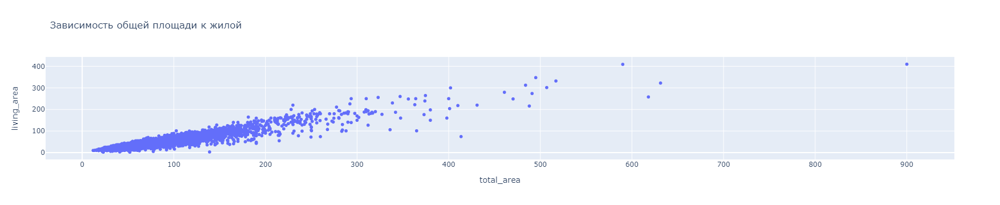

In [16]:
px.scatter(df, x='total_area',y='living_area', title='Зависимость общей площади к жилой')

In [17]:
#средняя доля зависимости жилий площади от общей
living_to_total = (df['living_area']/df['total_area']).mean()

#заполнение пропусков в жилой площади
df['living_area'] = df['living_area'].fillna(df['total_area']*living_to_total)

- **Площадь кухни:**

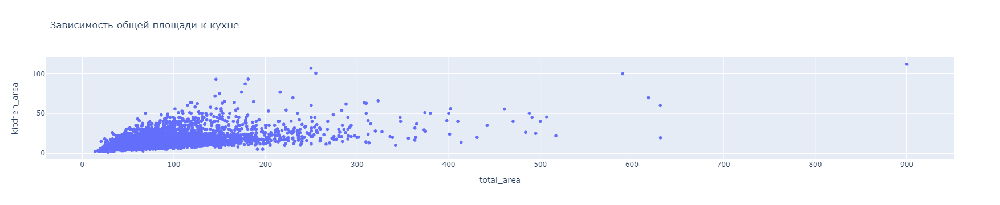

In [18]:
px.scatter(df,x='total_area',y='kitchen_area', title='Зависимость общей площади к кухне')

In [19]:
#средняя доля зависимости площади кухни от общей
kitchen_to_total = (df['kitchen_area']/df['total_area']).mean()

#заполнение пропусков в площади кухни
df['kitchen_area'] = df['kitchen_area'].fillna(df['total_area']*kitchen_to_total)

### Удаление пропусков <a id='5'></a>

- **Населенные пункты:**

In [20]:
#доля пропусков в населенных пунктах
df['locality_name'].isna().sum() / len(df)

0.002067597788936242

In [21]:
#удаление пропущенных значений
df = df.dropna(subset=['locality_name'])

- **Количество этажей:**

In [22]:
#доля пропусков в количестве этажей
df['floors_total'].isna().sum() / len(df)

0.003594080338266385

In [23]:
#удаление пропущенных значений в общем количестве этажей
df = df.dropna(subset=['floors_total'])

In [24]:
#количество пропусков
pd.DataFrame(round(df.isna().mean()*100,)).style.background_gradient('coolwarm')

,0
total_images,0.000000
last_price,0.000000
total_area,0.000000
first_day_exposition,0.000000
rooms,0.000000
ceiling_height,0.000000
floors_total,0.000000
living_area,0.000000
floor,0.000000
is_apartment,0.000000


### Вывод <a id='6'></a>
- **balcony** - пропущенные данные заполнены 0, так как логично предположить, что данные не были указаны из-за его отсутствия.
- **ceiling_height** - высота потолков скорее всего не была указана продавцом, пропущенные значения были заполнены медианой.
- **days_exposition** - пропуски либо по причине некорректной выгрузки, либо объявление еще актуально и не было снято с публикации.
- **parks_around3000, ponds_around3000** - пропущенные значения количества парков и водоемов были заполнены 0. Так как колонки с растоянием до объектов тоже пусты, предположительно, они отсутствуют возле данных квартир.
- **is_apartment** - пропущенные значения могут означать, что квартирыа не является апартаментами, поэтому пустые ячейки были заполнены значением False. 
- **locality_name** - доля пропущенных значений в данном столбце составляет 0.002, заполнить пропуски не представляется возможным, поэтому строки удалены.
- **floors_total** - доля пропущенных значений в данном столбце составляет 0.003, строки удалены.
- **days_exposition** - доля пропущенных значений 0.13, пропуски заполнены медианой.
- **living_area** - для заполнения пропусков вычислила среднее соотношение общей площади к жилой. Аналогичным способом заполнены пропуски в **kitchen_area**.

### **Изменение типов данных в ячейках** <a id='7'></a>

In [25]:
#изменение типа данных с object на datetime
df['first_day_exposition'] = pd.to_datetime(df['first_day_exposition'], format='%Y-%m-%dT%H:%M:%S')

#изменение типа данных с float на int
df['balcony'] = df['balcony'].astype('int')

#изменение типа данных с object на bool
df['is_apartment'] = df['is_apartment'].astype('bool')

#изменение типа данных с float на int
df['parks_around3000'] = df['parks_around3000'].astype('int')

#изменение типа данных с float на int
df['ponds_around3000'] = df['ponds_around3000'].astype('int')

#изменение типа данных с float на int
df['floors_total'] = df['floors_total'].astype('int')

#изменение типа данных с float на int
df['days_exposition'] = df['days_exposition'].astype('int')

### Вывод <a id='8'></a>
- В колонке **first_day_exposition** осталась только дата, без указания времени. Значит данные о времени были 00:00:00
- В колонке **balcony** не может быть указано пол балкона, поэтому тип данных был изменен на целочисленный.
- В колонке **is_apartment** тип данных был изменен на булевый.
- В колонках **parks_around3000, ponds_around3000** тип данных изменен на целочисленный.
- В колнке **floors_total** тип данных изменен на целочисленный.
- В колонке **days_exposition** тип данных изменен на целочисленный

### **Поиск и устранение дубликатов** <a id='9'></a>

In [26]:
#поиск явных дубликатов
df.duplicated().sum()

0

In [27]:
#уникальные значения в стобце населенных пунктов
print(df['locality_name'].sort_values(ascending=True).unique())

['Бокситогорск' 'Волосово' 'Волхов' 'Всеволожск' 'Выборг' 'Высоцк'
 'Гатчина' 'Зеленогорск' 'Ивангород' 'Каменногорск' 'Кингисепп' 'Кириши'
 'Кировск' 'Колпино' 'Коммунар' 'Красное Село' 'Кронштадт' 'Кудрово'
 'Лодейное Поле' 'Ломоносов' 'Луга' 'Любань' 'Мурино' 'Никольское'
 'Новая Ладога' 'Отрадное' 'Павловск' 'Петергоф' 'Пикалёво' 'Подпорожье'
 'Приморск' 'Приозерск' 'Пушкин' 'Санкт-Петербург' 'Светогорск'
 'Сертолово' 'Сестрорецк' 'Сланцы' 'Сосновый Бор' 'Сясьстрой' 'Тихвин'
 'Тосно' 'Шлиссельбург' 'городской поселок Большая Ижора'
 'городской поселок Янино-1' 'городской посёлок Будогощь'
 'городской посёлок Виллози' 'городской посёлок Лесогорский'
 'городской посёлок Мга' 'городской посёлок Назия'
 'городской посёлок Новоселье' 'городской посёлок Павлово'
 'городской посёлок Рощино' 'городской посёлок Свирьстрой'
 'городской посёлок Советский' 'городской посёлок Фёдоровское'
 'городской посёлок Янино-1' 'деревня Агалатово' 'деревня Аро'
 'деревня Батово' 'деревня Бегуницы' 'деревн

In [28]:
#датафрейм со значениями для замены
replacements = pd.DataFrame({'find':['ё','поселок городского типа','городской поселок','деревня'],
                             'replace':['е','пгт','пгт','поселок']})

#цикл для замены значиний
for i in range(len(replacements)):
    df['locality_name'] = df['locality_name'].str.replace(replacements['find'][i],
                                                          replacements['replace'][i],
                                                          case = False)
#дф для наглядности замен    
display(replacements)

,find,replace
0,ё,е
1,поселок городского типа,пгт
2,городской поселок,пгт
3,деревня,поселок


### Вывод <a id='10'></a>

Чтобы избавиться от неявных дубликатов было решено заменить Ё на Е, также для удобства "поселок городского типа" и "городской поселок" были заменены на "пгт". Деревни были переименованы в поселки, так как административно-территориальное деление не включает данное понятие.

### **Поиск и устранение аномальных значений** <a id='11'></a>

In [29]:
#еще раз вывожу описание обновленных данных для удобства
df.describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,airports_nearest,city_centers_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
count,23565.000000,2.356500e+04,23565.000000,23565.000000,23565.000000,23565.000000,23565.000000,23565.000000,23565.000000,23565.000000,18041.000000,18064.000000,23565.000000,8030.000000,23565.000000,9036.000000,23565.000000
mean,9.878421,6.540058e+06,60.322824,2.070656,2.724530,10.675875,34.560141,5.878124,10.565462,0.593677,28797.082701,14192.656056,0.468831,490.580448,0.589900,518.289509,169.203692
std,5.681156,1.091093e+07,35.657060,1.078591,0.991026,6.594823,22.345289,4.871485,6.093273,0.960660,12632.499735,8613.348153,0.748403,341.572956,0.883966,278.009558,206.497729
min,0.000000,1.219000e+04,12.000000,0.000000,1.000000,1.000000,2.000000,1.000000,1.300000,0.000000,0.000000,181.000000,0.000000,1.000000,0.000000,13.000000,1.000000
25%,6.000000,3.400000e+06,40.000000,1.000000,2.600000,5.000000,19.000000,2.000000,7.000000,0.000000,18565.000000,9238.000000,0.000000,288.000000,0.000000,293.000000,45.000000
50%,9.000000,4.646000e+06,52.000000,2.000000,2.650000,9.000000,30.000000,4.000000,9.000000,0.000000,26757.000000,13096.500000,0.000000,455.000000,0.000000,503.000000,95.000000
75%,14.000000,6.790000e+06,69.700000,3.000000,2.700000,16.000000,42.100000,8.000000,12.000000,1.000000,37273.000000,16285.000000,1.000000,612.000000,1.000000,730.000000,198.000000
max,50.000000,7.630000e+08,900.000000,19.000000,100.000000,60.000000,409.700000,33.000000,112.000000,5.000000,84869.000000,65968.000000,3.000000,3190.000000,3.000000,1344.000000,1580.000000


- **Высота потолков**

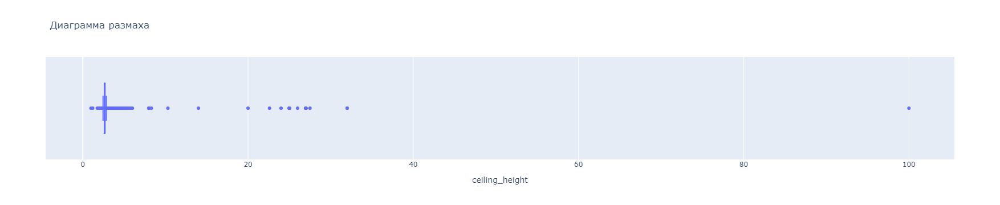

In [30]:
#поиск аномальных значений в колонке с высотой потолков
px.box(df,'ceiling_height',title='Диаграмма размаха')

In [31]:
#удаление значений больше 100м в высоте потолков
df = df.loc[df['ceiling_height'] < 100]

#значения больше 20 умножаются на 0.1, чтобы исключить ошибочную запись(25м=2.5м)
df.loc[df['ceiling_height'] >= 20,'ceiling_height'] *= 0.1

#удаление значений меньше 2м в высоте потолков
df = df.loc[df['ceiling_height'] > 2]

#замена значений выше 5м медианой
df.loc[df['ceiling_height'] > 5,'ceiling_height'] = median_height

- **Общая площать:**

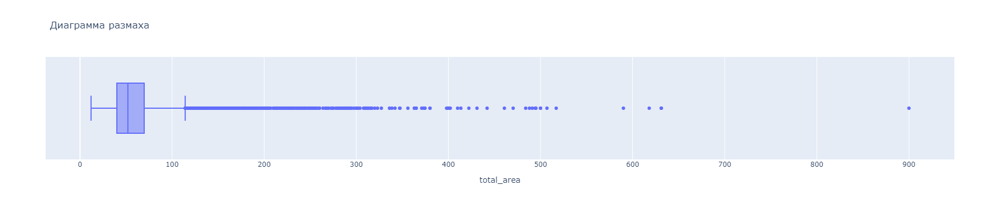

In [32]:
#поиск аномальных значений в колонке с общей площадью
px.box(df,'total_area',title='Диаграмма размаха')

In [33]:
#удаление значений больше 520 кв.м в общей площади
df = df.loc[df['total_area'] < 520]

- **Площадь кухни:**

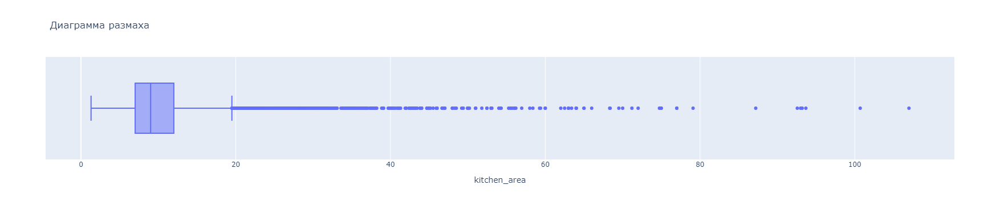

In [34]:
#поиск аномальных значений в колонке с площадью кухни
px.box(df,'kitchen_area',title='Диаграмма размаха')

In [35]:
#удаление значений с площадью кухни больше 80 кв.м
df = df.loc[df['kitchen_area'] < 80]

- **Общее количество этажей в доме:**

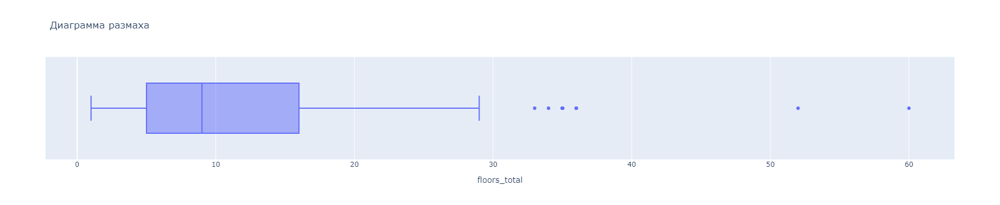

In [36]:
#поиск аномальных значений в колонке с количеством этажей в доме
px.box(df,'floors_total',title='Диаграмма размаха')

In [37]:
#удаление значений в колонке с количеством этажей в доме выше 30
df = df.loc[df['floors_total'] < 30]

- **Цена объекта**

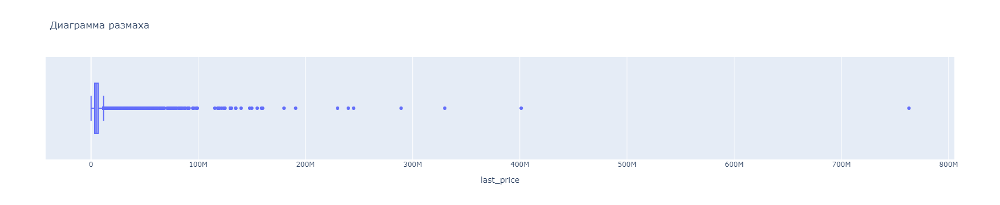

In [38]:
#поиск аномальных значений в колонке с ценой объекта
px.box(df,'last_price',title='Диаграмма размаха')

In [39]:
#удаление аномальных значений в колонке с ценой объекта
df = df.loc[df['last_price'] < 750000000]

### Вывод <a id='12'></a>
- В колонке **ceiling_height** были удалены значения меньше 2м и больше 100м. Значения выше 20м были снижены на десятую часть, оставшиеся значения больше 4м были заменены медианой.
- В колонке **total_area** большинство значений находится в пределах 520 кв.м. Остальные значения удалены.
- В колонке **kitchen_area** большинство значений находится в пределах 80 кв.м. Остальные значения удалены.
- В колонке **floors_total** основные значения лежат в пределах 30 этажей. Остальные значения удалены.
- В колонке **last_price** удалено значение с ценой свыше 750М.

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__
    
Второй раздел сделан хорошо. Проверены основные возможные проблемы в данных.

## Добавление новых столбцов <a id='13'></a>

In [40]:
#цена квадратного метра
df['price_for_meter'] = round(df['last_price']/df['total_area'])

In [41]:
#день, месяц, год
df['day'] = df['first_day_exposition'].dt.weekday
df['month'] = df['first_day_exposition'].dt.month
df['year'] = df['first_day_exposition'].dt.year

In [42]:
#тип этажа квартиры
df.loc[df['floor'] == 1,'floor_category'] = 'первый'
df.loc[df['floor'] == df['floors_total'],'floor_category'] = 'последний'
df['floor_category'] = df['floor_category'].fillna('другой')

In [43]:
#расстояние до центра в км
df['centers_nearest_km'] = round(df['city_centers_nearest']/1000)

In [44]:
df = df.reset_index(drop = True)

**Добавлены новые столбцы:**
- округленная цена за квадратный метр
- столбцы с датой, разделенной на день, месяц и год
- тип этажа квартиры, разделенный на три категории
- округленное расстояние до центра в километрах

## Исследовательский анализ данных <a id='14'></a>

In [45]:
#функция для подсчета доли объявлений по необходимому параметру
def meaning(data,column,number):
    result = data.loc[data[column] > number]
    return len(result)/len(data)

### Общая площадь <a id='a'></a>

- Чаще всего продают квартиры площадью от 30 до 50 кв.м.
- Больше всего объявлений в диапазоне площади от 30 до 75 кв.м.
- Квартиры с площадью больше 75 кв.м встречаются в 19% объявлений.

In [46]:
#описание колонки с общей площадью
df['total_area'].describe()

count    23505.000000
mean        60.118337
std         34.132817
min         12.000000
25%         40.000000
50%         52.000000
75%         69.600000
max        517.000000
Name: total_area, dtype: float64

In [47]:
#доля квартир с жилой пощадью выше 75 кв.м.
meaning(df,'total_area',75)

0.19366092320782813

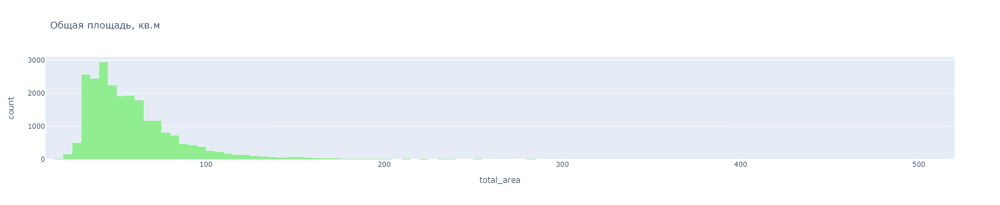

In [48]:
#гистограмма общей площади
px.histogram(df,'total_area',
             nbins=200,
             color_discrete_sequence=['lightgreen'],
             title='Общая площадь, кв.м')

### Жилая площадь <a id='b'></a>

- У большого количества объявлений жилая площадь достаточно маленька, 15-20 кв.м.
- Второй пик приходися на значения от 25 до 35 кв.м.
- Основная часть объявлений приходится на площадь до 50 кв.м
- Объявления свыше 50 кв.м занимают 13% от общей выборки.
- Присутсвуют **аномальные значения** меньше 5 кв.м жилой площади, при общей площади свыше 20 кв.м. Только одна запись соответсвует студии. Скорее всего это ошибки ручного ввода.

In [49]:
#описание колонки с жилой площадью
df['living_area'].describe()

count    23505.000000
mean        34.463584
std         21.684950
min          2.000000
25%         19.000000
50%         30.000000
75%         42.000000
max        347.500000
Name: living_area, dtype: float64

In [50]:
#доля квартир с жилой пощадью выше 50 кв.м.
meaning(df,'living_area',50)

0.133971495426505

In [51]:
#аномальные значения ниже 5 кв.м. жилой площади
df.loc[df['living_area'] < 5]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,price_for_meter,day,month,year,floor_category,centers_nearest_km
3217,7,4440000.0,41.0,2017-07-02,1,2.65,17,3.0,17,False,...,NaN,0,NaN,216,108293.0,6,7,2017,последний,13.0
13804,20,6350000.0,52.0,2018-02-06,2,3.00,6,2.0,2,False,...,NaN,1,1012.0,91,122115.0,1,2,2018,другой,7.0
21579,0,2330000.0,23.0,2018-01-01,0,2.65,24,2.0,22,False,...,NaN,0,NaN,66,101304.0,0,1,2018,другой,NaN
23382,14,64990000.0,139.0,2015-11-24,3,3.00,8,3.0,8,False,...,630.0,3,100.0,280,467554.0,1,11,2015,последний,6.0


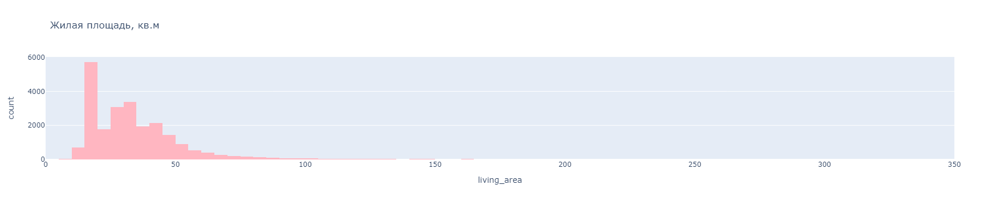

In [52]:
#гистограмма жил.площади
px.histogram(df,'living_area',
             nbins=170,
             color_discrete_sequence=['lightpink'],
             title='Жилая площадь, кв.м')

### Площадь кухни <a id='c'></a>

- Чаще всего встречаются квартиры с кухней от 5.5 до 12 кв.м
- Вторую по величине группу можно выделить с кухнями от 12 до 15.5 кв.м.
- Объекты с кухней свыше 15.5 кв.м занимают 10% от общей выборки.
- Присутсвуют аномальные значения до 1.5 кв.м. При этом объект не является студией.

In [53]:
#описание колонки с площадью кухни
df['kitchen_area'].describe()

count    23505.000000
mean        10.520551
std          5.812796
min          1.300000
25%          7.000000
50%          9.000000
75%         12.000000
max         79.101171
Name: kitchen_area, dtype: float64

In [54]:
#доля кухонь с пощадью выше 15 кв.м.
meaning(df,'kitchen_area',15.4)

0.10699851095511594

In [55]:
#аномальные значения ниже 1.5 кв.м. площади кухни
df.loc[df['kitchen_area'] < 1.5]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,price_for_meter,day,month,year,floor_category,centers_nearest_km
20053,7,4250000.0,28.5,2019-05-01,1,2.8,14,19.5,10,False,...,NaN,0,NaN,95,149123.0,2,5,2019,другой,13.0


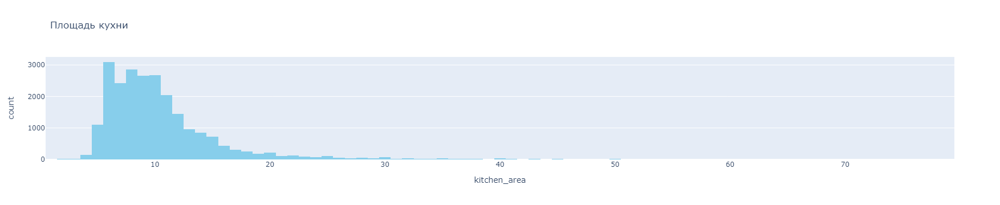

In [56]:
px.histogram(df,'kitchen_area',
             nbins=80,
             color_discrete_sequence=['skyblue'],
             title='Площадь кухни')

### Цена объекта <a id='d'></a>

- Пик значений стоимости приходится на диапазон от 3.5 млн. до 4 млн.
- В среднем, цена колеблется от 2.5 млн. до 6 млн.
- Количество объявлений с квартирами дороже 6 млн. постепенно идет на спад.
- Объекты, стоимостью больше 10 млн, приходится 11% объявлений.
- Присутсвуют **аномальные значения** ниже 500 тыс.
Обнаружено объявление с общей площадью 109 кв.м. за 12 тыс. Данная запись была удалена.

In [57]:
#описание колонки с ценой объекта
df['last_price'].describe()

count    2.350500e+04
mean     6.446081e+06
std      8.982294e+06
min      1.219000e+04
25%      3.400000e+06
50%      4.630000e+06
75%      6.757702e+06
max      4.013000e+08
Name: last_price, dtype: float64

In [58]:
#доля квартир с ценой выше 10 млн.
meaning(df,'last_price',10000000)

0.11406083811954904

In [59]:
#аномальные значения с ценой ниже 500 тыс. 
df.loc[df['last_price'] < 500000]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,price_for_meter,day,month,year,floor_category,centers_nearest_km
5656,7,450000.0,42.0,2017-07-31,2,2.65,1,23.000000,1,False,...,NaN,0,NaN,233,10714.0,0,7,2017,последний,NaN
6805,6,490000.0,40.0,2017-12-11,1,2.65,5,22.590621,3,False,...,NaN,0,NaN,43,12250.0,0,12,2017,другой,NaN
8729,7,12190.0,109.0,2019-03-20,2,2.75,25,32.000000,25,False,...,805.0,0,NaN,8,112.0,2,3,2019,последний,9.0
9511,7,450000.0,43.4,2018-08-31,2,2.65,5,30.300000,3,False,...,NaN,0,NaN,96,10369.0,4,8,2018,другой,NaN
10697,3,490000.0,29.1,2016-05-05,1,2.50,5,17.000000,5,False,...,NaN,0,NaN,719,16838.0,3,5,2016,последний,NaN
14790,5,430000.0,54.0,2018-06-26,2,2.65,3,30.497338,3,False,...,NaN,0,NaN,44,7963.0,1,6,2018,последний,NaN
15905,8,480000.0,32.0,2019-01-06,1,2.65,2,16.000000,1,False,...,NaN,0,NaN,83,15000.0,6,1,2019,первый,NaN
16092,14,450000.0,38.5,2018-07-11,2,2.65,2,21.743473,1,False,...,NaN,0,NaN,45,11688.0,2,7,2018,первый,NaN
16146,18,440000.0,40.0,2018-07-10,1,2.65,5,22.590621,1,False,...,NaN,0,NaN,45,11000.0,1,7,2018,первый,NaN
17315,7,430000.0,30.4,2019-04-22,1,2.65,2,16.000000,1,False,...,NaN,0,NaN,95,14145.0,0,4,2019,первый,NaN


In [60]:
#удаление объекта с ценой квартиры 12 тыс.
df = df.loc[df['last_price'] > 13000]

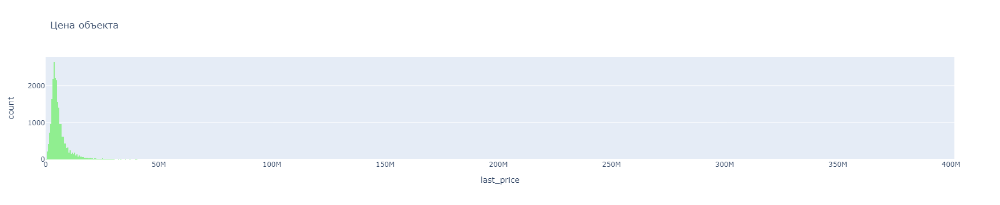

In [61]:
#гистограмма цены объектов
px.histogram(df,'last_price',
             color_discrete_sequence=['lightgreen'],
             title='Цена объекта')

### Количество комнат <a id='e'></a>

- Чаще всего продаются квартиры с 1-2 комнатами
- Основной диапазон обявлений в пределах 1-3 комнат.
- Квартиры с больше чем 3 комнатами встречаются в 7% объявлений.
- **Аномальные значения**: из 192 объявлений с 0 комнат, только 134 являются студиями. Квартиры, с количеством комнат больше 7. Также присутсвует квартира площадью 371 кв.м. с 0 комнат.

In [62]:
#описание колонки с количеством комнат
df['rooms'].describe()

count    23504.000000
mean         2.069265
std          1.071960
min          0.000000
25%          1.000000
50%          2.000000
75%          3.000000
max         19.000000
Name: rooms, dtype: float64

In [63]:
#доля квартир, с количеством комнат больше 3
meaning(df,'rooms',3)

0.07164737916950306

In [64]:
#объекты с 0 комнат и значением студия
df.loc[(df['rooms'] == 0) & (df['studio'] == True)]['studio'].count()

134

In [65]:
#у квартиры 0 комнат и большая общая площадь, не является студией
df.loc[(df['rooms'] == 0) & (df['studio'] == False) & (df['total_area'] > 100)]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,price_for_meter,day,month,year,floor_category,centers_nearest_km
19234,5,71000000.0,371.0,2018-07-26,0,3.57,7,209.528009,6,False,...,761.0,1,584.0,90,191375.0,3,7,2018,другой,6.0


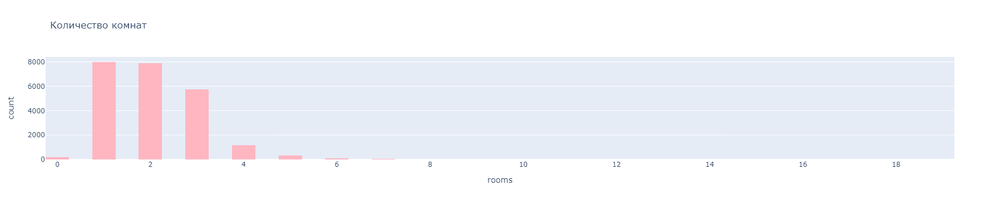

In [66]:
#гистограмма количества комнат
px.histogram(df,'rooms',
             nbins=50,
             color_discrete_sequence=['lightpink'],
             title='Количество комнат')

### Высота потолков <a id='f'></a>

- Потолки в большинстве квартир высотой 2.65 м.
- Основной диапазон от 2.5 м. до 2.9 м.
- С высотой потолков больше 2.9 м. объявления встречаются в 11% общей выборки.

In [67]:
#описание колонки с высотой потолков
df['ceiling_height'].describe()

count    23504.000000
mean         2.696222
std          0.215184
min          2.200000
25%          2.600000
50%          2.650000
75%          2.700000
max          5.000000
Name: ceiling_height, dtype: float64

In [68]:
#доля квартир с потолками выше
meaning(df,'ceiling_height',2.9)

0.11372532334921716

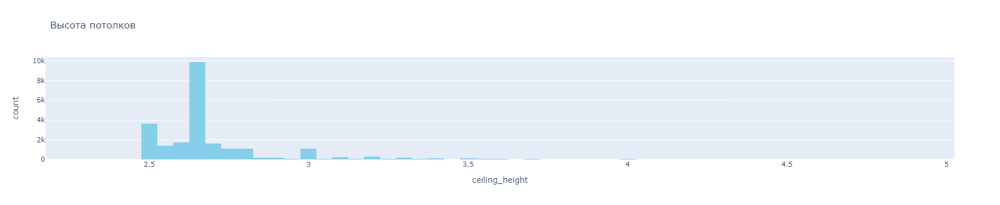

In [69]:
#гистограмма высоты потолков
px.histogram(df,'ceiling_height',
             nbins=100,
             color_discrete_sequence=['skyblue'],
             title='Высота потолков')

### Этаж квартиры <a id='g'></a>

- Большинство объектов располагаются на 2ом этаже.
- Основной диапозон с 1 по 5 этаж.
- Вторая по величине группа - с 6 по 9 этаж.
- Квартиры, расположенные выше 9 этажа, встречаются в 17% объявлений.

In [70]:
#описание колонки с этажом квартиры
df['floor'].describe()

count    23504.000000
mean         5.861215
std          4.841650
min          1.000000
25%          2.000000
50%          4.000000
75%          8.000000
max         27.000000
Name: floor, dtype: float64

In [71]:
#доля квартир выше 9 этажа
meaning(df,'floor',9)

0.17809734513274336

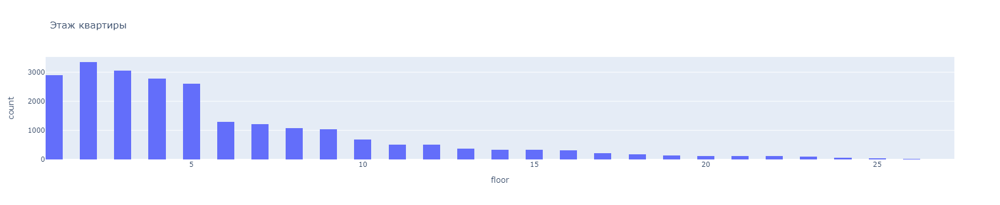

In [72]:
#гистограмма этажа квартиры
px.histogram(df,'floor',
             nbins=100,
             title='Этаж квартиры')

### Количество этажей в доме <a id='h'></a>

- Больше всего квартир продаются в домах с 5 и 9 этажами.
- Во вторую по величени группу можно выделить дома с 4, 10, 12 и 16 этажами
- У 25 объявлений указано **аномальное значение** в 1 этаж.

In [73]:
#описание колонки с количесивом этажей в доме
df['floor'].describe()

count    23504.000000
mean         5.861215
std          4.841650
min          1.000000
25%          2.000000
50%          4.000000
75%          8.000000
max         27.000000
Name: floor, dtype: float64

In [74]:
#доля домов выше 19 этажа
meaning(df,'floors_total',19)

0.12376616746085772

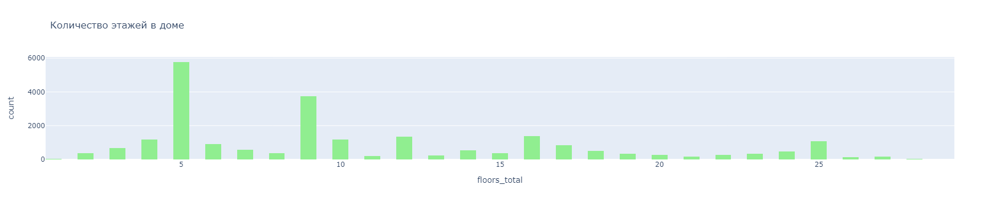

In [75]:
#гистограмма общего количества этажей в доме
px.histogram(df,'floors_total',
             nbins=100,
             color_discrete_sequence=['lightgreen'],
             title='Количество этажей в доме')

### Тип этажа квартиры <a id='i'></a>

Преобладают объявления, квартиры в которых не находятся на первом или последнем этаже. Но в данных присутствуют пропуски, поэтому невозвомжно сделать корректный вывод.

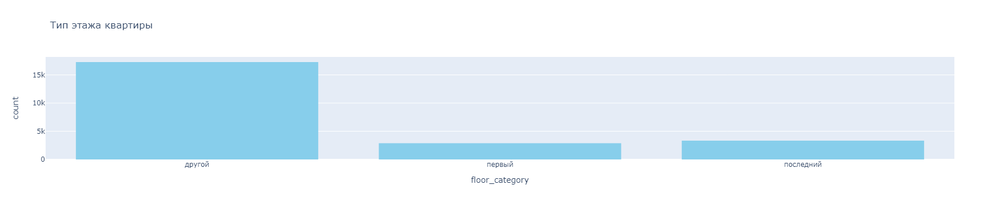

In [76]:
#гистограмма типов этажа квартиры
px.histogram(df,'floor_category',
             color_discrete_sequence=['skyblue'],
             title='Тип этажа квартиры')

### Расстояние до центра города <a id='j'></a>

- Чаще всего квартиры находятся на расстоянии 10-15 км от центра.
- Присутствует второй пик значений с удаленностью 4-6 км. от центра города.
- Квартиры, свыше 20км от центра города, только в 10% объявлений

In [77]:
#описание колонки с расстоянием до центра города
df['city_centers_nearest'].describe()

count    18012.000000
mean     14187.159560
std       8613.630165
min        181.000000
25%       9238.000000
50%      13093.000000
75%      16270.000000
max      65968.000000
Name: city_centers_nearest, dtype: float64

In [78]:
#доля квартир на расстоянии свыше 20 км. от центра 
meaning(df,'city_centers_nearest', 20000)

0.10976855003403677

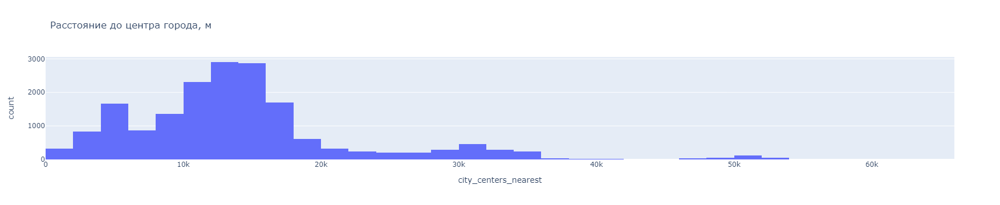

In [79]:
#гистограмма расстояния до центра города
px.histogram(df,'city_centers_nearest',
             nbins=50,
             title='Расстояние до центра города, м')

### Расстояние до ближайшего аэропорта <a id='k'></a>

- Пиковое значение 20-25 км от аэропорта до объекта.
- На гистограмме можно выделить три основные группы по расстоянию:
    - от 10 до 25 км
    - от 25 до 40 км
    - от 40 до 55 км
- Присутствует одно аномальное значение в 0 км.

In [80]:
#описание колонки с расстоянием до ближайшего аэропорта
df['airports_nearest'].describe()

count    17989.00000
mean     28812.04336
std      12639.32065
min          0.00000
25%      18545.00000
50%      26768.00000
75%      37294.00000
max      84869.00000
Name: airports_nearest, dtype: float64

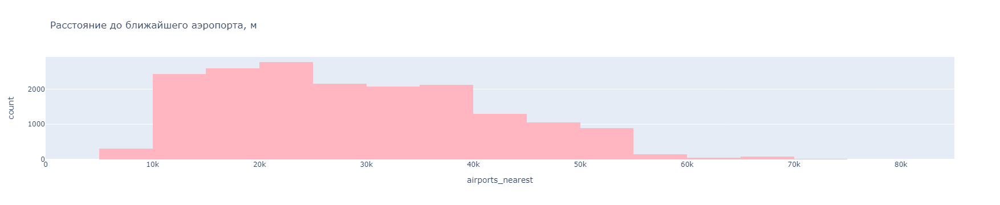

In [81]:
#гистограмма расстояния до аэропорта
px.histogram(df,'airports_nearest',
             nbins=40,
             color_discrete_sequence=['lightpink'],
             title='Расстояние до ближайшего аэропорта, м')

### Расстояние до ближайшего парка <a id='l'></a>

- Пик значение это 400-500 м. до парка
- Небольшое количество квартир(419 из всей выборки) находится в непосредственной близости (до 100 м)
- Большая часть продаваемых объектов находится на расстоянии 700м от парка.
- Только 4% квартир находятся от парков дальше 700м.

In [82]:
#описание колонки с расстоянием до ближайшего парка
df['parks_nearest'].describe()

count    8012.000000
mean      490.379930
std       341.202451
min         1.000000
25%       288.000000
50%       455.000000
75%       612.000000
max      3190.000000
Name: parks_nearest, dtype: float64

In [83]:
#доля квартир дальше 700 м от парка
meaning(df,'parks_nearest',700)

0.04833219877467665

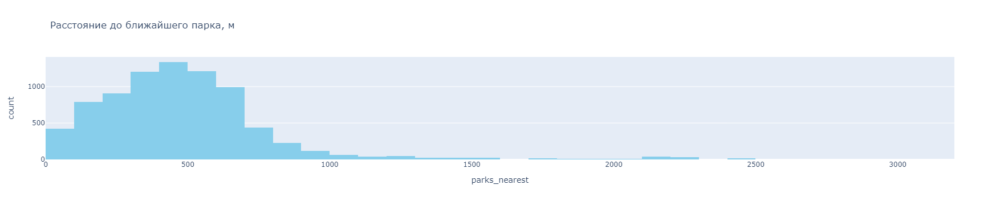

In [84]:
#гистограмма расстояния до ближайшего парка
px.histogram(df,'parks_nearest',
             nbins=40,
             color_discrete_sequence=['skyblue'],
             title='Расстояние до ближайшего парка, м')

### День публикации <a id='m'></a>

- В рабочии дни количество объявлений за сутки находится на стабильно высоком уровне.
- В выходные показатели за сутки падают вдвое.

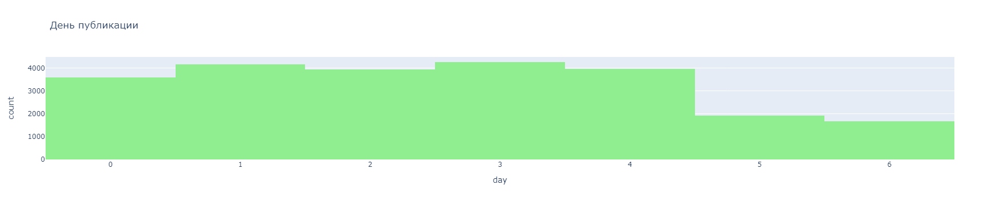

In [85]:
#гистограмма дней публикации
px.histogram(df,'day',
             color_discrete_sequence=['lightgreen'],
             title='День публикации')

### Месяц публикации <a id='n'></a>
- После спада в январе, количество обявлений резко возрастает.
- В мае показатели падают.
- С июня количество квартир, выставленных на продажу стабильно растет.
- В декабре снова идет спад.

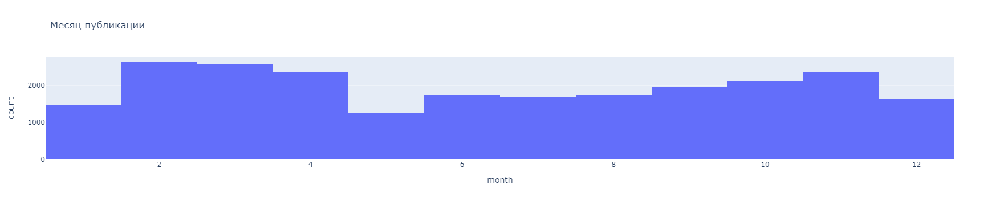

In [86]:
#гистограмма месяца публикации
px.histogram(df,'month',
             title='Месяц публикации')

### Вывод <a id='15'></a>

**Характеристики средней продаваемой квартиры:** 2-комнатная квартира, с общей площадью 52 кв.м, с высотой потолков 2.65 м, расположены выше 1 этажа, в 10-15 км от центра, рядом с парком, 10-30 км от аэропорта, по цене 4.6 млн. руб, проданная в среднем за 3 месяца.

**Аномальные характеристики продаваемых квартир:** 
- от 7 до 19 комнат
- потолки с высотой 2.25м и 5м
- цена выше 10 млн и ниже 500 тыс.(один объект за 12 тыс.)
- жилая площадь менее 5 кв.м.
- 0 комнат при наличии большой площади
- проданная за 428 дней и более

## Срок продажи квартиры <a id='16'></a>

In [87]:
#описание колонки со сроком продажи квартиры
df['days_exposition'].describe()

count    23504.000000
mean       169.308969
std        206.648878
min          1.000000
25%         45.000000
50%         95.000000
75%        198.000000
max       1580.000000
Name: days_exposition, dtype: float64

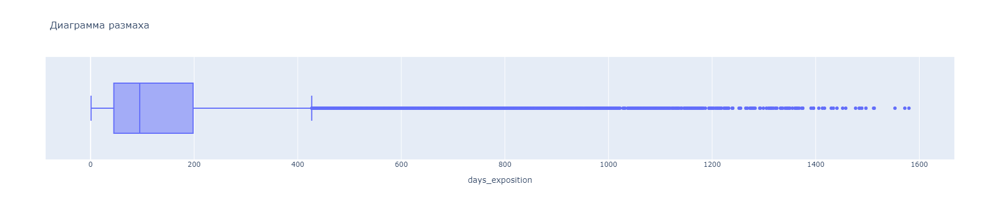

In [88]:
#диаграмма размаха сроков размещения объявления
px.box(df,'days_exposition',title='Диаграмма размаха')

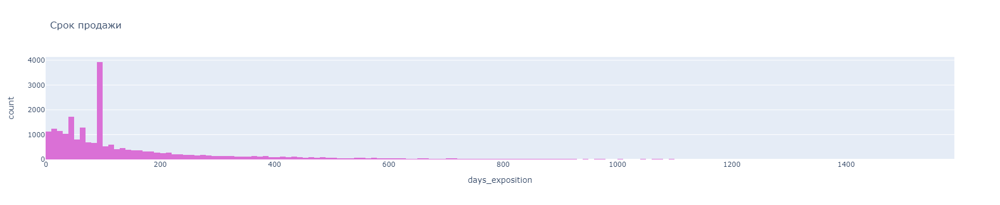

In [89]:
#гистограмма сроков продажи квартиры
px.histogram(df,'days_exposition',
             nbins=200,
             color_discrete_sequence=['orchid'],
             title='Срок продажи')

In [90]:
#доля продаж меньше 45 дней
len(df.loc[df['days_exposition'] < 45 ])/len(df)

0.21515486725663716

In [91]:
#доля продаж меньше 30 дней
len(df.loc[df['days_exposition'] < 30 ])/len(df)

0.14916609938733832

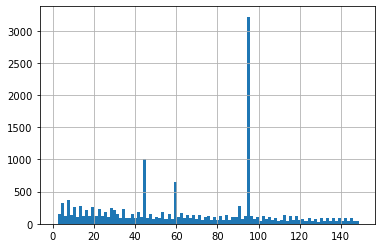

In [92]:
df['days_exposition'][df['days_exposition'] < 150].hist(bins = 100);

### Вывод

- В среднем, квартира продается за **90-100 дней (3 месяца)**.
- По диаграмме размаха можно увидеть, что адекватные сроки продажи лежат в промежутке от 45 до 198 дней.
- Аномально долгая продажа у квартир, с момента публикации объявлений которых прошло **больше 428 дней(14 месяцев)**.
- Доля продаж **меньше 45 дней** занимает 21% выборки и находятся в границах нормальных значений в диаграмме размаха. Неизвестно, стоит ли считать такие продажи аномально быстрыми, так как нет данных, что вартиры были действительно проданы или объявление о продаже было снято по инициативе продавца.

## Факторы, влияющие на стоимость квартиры <a id='17'></a>

In [93]:
#функция для построения графика корреляции
def corr_plot(data,column,plot_title):
    x = data[column]    #  x - координаты точек
    y = data['last_price']   #  y - координаты точек

    fig, ax = plt.subplots()

    ax.scatter(x, y,
               c = 'deeppink')    #  цвет точек

    ax.set_facecolor('white')     #  цвет области Axes
    ax.set_title(plot_title)     #  заголовок для Axes

    fig.set_figwidth(8)     #  ширина и
    fig.set_figheight(8)    #  высота "Figure"

    return plt.show()

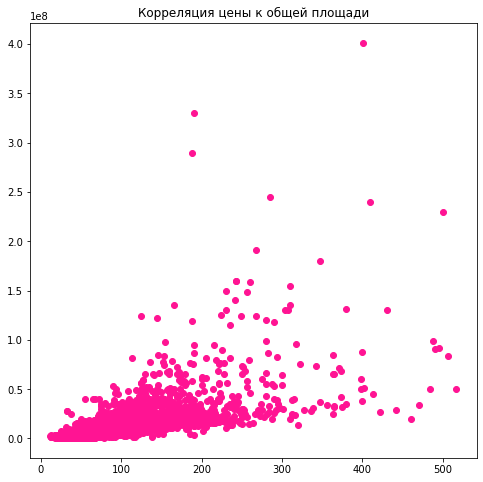

Значение корреляции: 0.683312398181627


In [94]:
#корреляция цены к общей площади
corr_plot(df,'total_area','Корреляция цены к общей площади')
print('Значение корреляции:',df['total_area'].corr(df['last_price']))

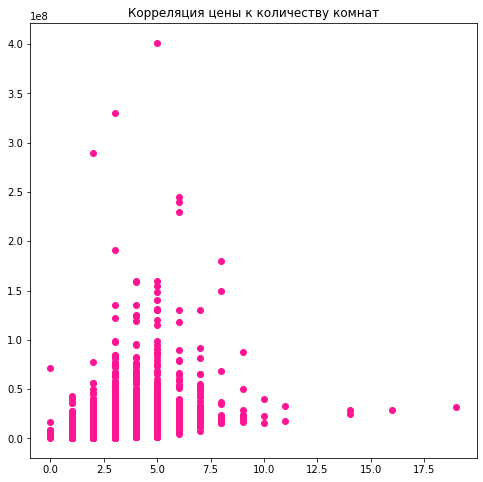

Значение корреляции: 0.39272715197634966


In [95]:
#корреляция цены к количеству комнат
corr_plot(df,'rooms','Корреляция цены к количеству комнат')
print('Значение корреляции:',df['rooms'].corr(df['last_price']))

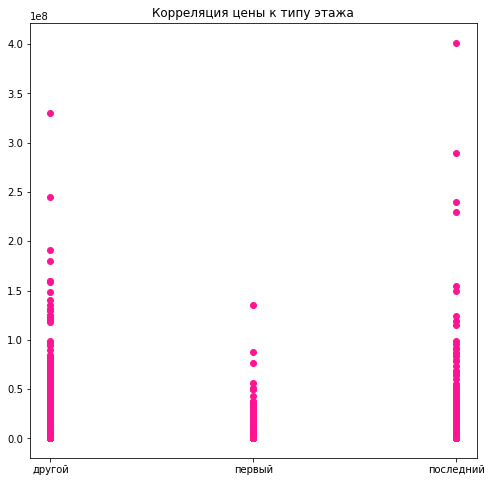

In [96]:
#корреляция цены к типу этажа
corr_plot(df,'floor_category','Корреляция цены к типу этажа')

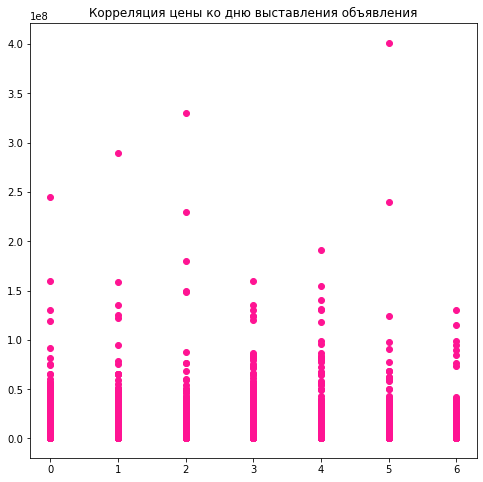

Значение корреляции: -0.0011026130135416727


In [97]:
#корреляция цены ко дню выставления объявления
corr_plot(df,'day','Корреляция цены ко дню выставления объявления')
print('Значение корреляции:',df['day'].corr(df['last_price']))

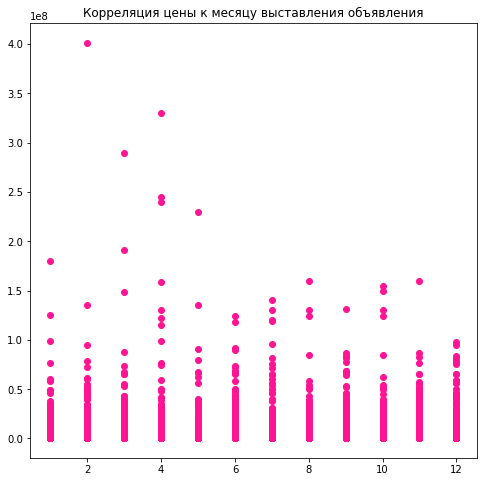

Значение корреляции: -0.001155593829761182


In [98]:
#корреляция цены к месяцу выставления объявления
corr_plot(df,'month','Корреляция цены к месяцу выставления объявления')
print('Значение корреляции:',df['month'].corr(df['last_price']))

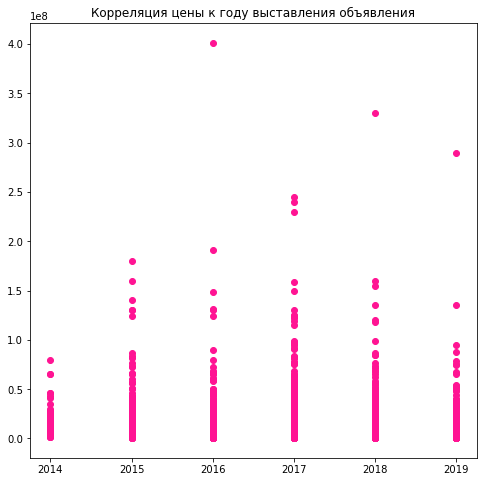

Значение корреляции: -0.050628211397534206


In [99]:
#корреляция цены к году выставления объявления
corr_plot(df,'year','Корреляция цены к году выставления объявления')
print('Значение корреляции:',df['year'].corr(df['last_price']))

In [100]:
#сводная таблица по годам с медианой цены 1 кв.м. и общей площади продаваемых квартир
dinamic_price = df.pivot_table(index='year', values=['price_for_meter','total_area'], aggfunc='median').reset_index()
dinamic_price

,year,price_for_meter,total_area
0,2014,106902.0,76.18
1,2015,93333.0,60.00
2,2016,91667.0,53.01
3,2017,92520.0,52.00
4,2018,95688.5,50.50
5,2019,103138.5,51.85


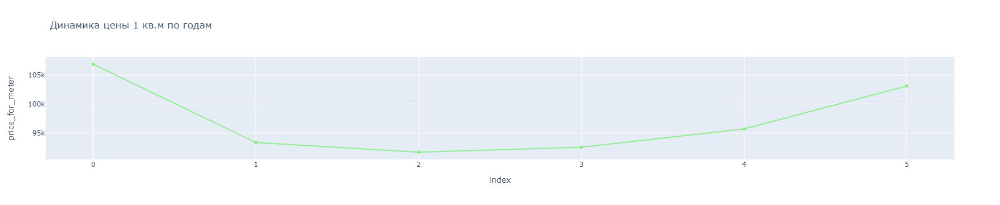

In [101]:
#линейный график динамики цены 1 кв.м. по годам
px.line(dinamic_price,y='price_for_meter',
        color_discrete_sequence=['lightgreen'],
        title = 'Динамика цены 1 кв.м по годам',
        markers = True)

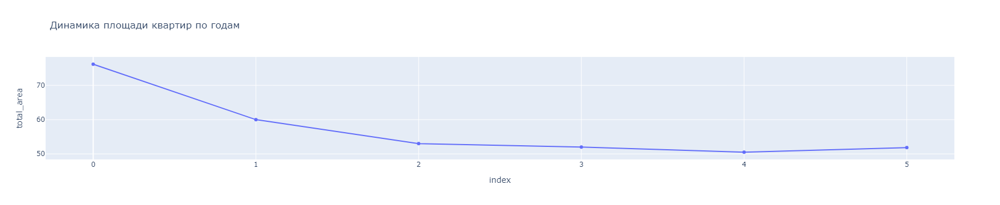

In [102]:
#линейный график площади продаваемых квартир по года
px.line(dinamic_price,y='total_area',
        title = 'Динамика площади квартир по годам',
        markers = True)

### Вывод <a id='18'></a>

- Как и ожидалось, основным фактором, влияющим на стоимость является **площадь квартиры**. Коэффициент корреляции положительный и составляет 0.68. Также значимую роль играет **жилая площадь**(0.61) и **площадь кухни**(0.53).
- **Количество комнат** также влияет на цену, чем их больше, тем стоимость выше.
- В среднем, квартиры, расположенные на **первом** или **последнем этаже**, продаются дешевле.
- Влияние **дня и месяца** выставления объявления на стоимость не обнаружено.
- Как показывают графики, с 2014 по 2016 цена за кв.м. стремительно падала. Но уже 2017 по 2019 цены стали расти. При этом медиана общей площади продаваемых квартир упала с 76 кв.м. до 52 кв.м.

## Средняя цена 1 кв.м. в 10 населенных пунктах с наибольшим числом объявлений <a id='19'></a>

In [103]:
#сводная таблица, группированная по населенным пунктам
top_10 = df.pivot_table(index='locality_name', values='price_for_meter',aggfunc=['count','median'])
top_10.columns = ['count', 'median']
top_10.sort_values('count', ascending=False).head(10)

,count,median
locality_name,,
Санкт-Петербург,15601,104750.0
поселок Мурино,552,86059.5
поселок Шушары,439,76829.0
Всеволожск,397,65789.0
Пушкин,369,100000.0
Колпино,338,74723.5
поселок Парголово,327,91643.0
Гатчина,307,67797.0
поселок Кудрово,299,91860.0


### Вывод <a id='20'></a>
- Cамая большая стоимость 1 кв.м в Санк-Петербурге, за ним идут пос.Кудрово и г.Пушкин.
- Дешевле всего 1 кв.м в г.Всеволожск и г.Выборг.
- Не ясна причина более высокой стоимости в поселках по сравнению с городами. Возможно влияет близкое расположение к Санкт-Петербургу.

## Стоимость квартиры в зависимости расстояния до центра <a id='21'></a>

In [104]:
#отфильстрованый датасет по г.Санкт-Петербург
df_spb = df.loc[df['locality_name'] == 'Санкт-Петербург'].sort_values(by='centers_nearest_km')

In [105]:
#сводная таблица с медианой и средним значением стоимости квартиры в зависимости от расстояния
price_spb = df_spb.pivot_table(index='centers_nearest_km', values='last_price',aggfunc='median')
price_spb.columns = ['median_price']
price_spb

,median_price
centers_nearest_km,
0.0,15900000.0
1.0,11395000.0
2.0,10000000.0
3.0,8409000.0
4.0,9200000.0
5.0,9400000.0
6.0,8890000.0
7.0,7800000.0
8.0,7400000.0


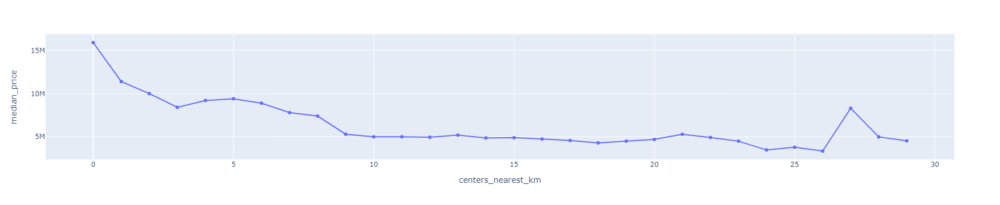

In [106]:
#линейный график 
price_spb = price_spb.reset_index()
px.line(price_spb, x='centers_nearest_km', y='median_price', markers = True)

In [107]:
#корреляция цены и близости к центру
df_spb['last_price'].corr(df_spb['centers_nearest_km'])

-0.30278884789852956

In [108]:
#стоимость км в зависимости удалености от центра
price_for_km = round(price_spb['median_price'].median()/len(price_spb))
price_for_km

166500

### Вывод <a id='22'></a>

- Расстояние до центра города влияет на стоимость. В большинстве случаев, чем дальше от центра, тем дешевле квартиры. Есть некоторые выбивающиеся значения на 21 и 27 километре.
- Медиана стоимости 1 км удаленности от центра 166.500 руб.

## Общий вывод <a id='23'></a>

Датасет содержит данные по 23699 объектам недвижимости,каждый из которых описывается 22 признаками (колонками).

**Предобработка данных:**

У некоторых признаков присутсвовали множественные пропуски и аномальные значения. Пустые значения были заполнены корректными данными, аномальные были исправлены.
Данные,у которых невозможно восстановить корректные значения, были удалены.

Тип данных нескольких столбцов были заменены на необходимые для удобной работы и проведния расчетов.

Добавлены новые стобцы с ценой 1 кв.м.,тип этажа квартиры, расчитано расстояние до центра в км, дата разделена на день месяц и год. 

Эти изменения помогли прийти к верным выводам при дальнейшем анализе данных.

**Анализ данных показал:**

**Типичная квартира**, выставленная на продажу: 2-комнатная, с общей площадью 52 кв.м, с высотой потолков 2.65м, расположены выше 1 этажа, в 10-15км от центра, рядом с парком, 10-30 км от аэропорта, по цене 4.6 млн. руб, проданная в среднем за 3 месяца.

**На стоимость квартиры сильнее всего влияет:**
- Общая площадь
- Количество комнат
- Этаж и расстояние до центра города.

Чем ближе к центру, тем эти факторы весомее.

**Были обнаружены аномальные значения:**
- от 7 до 19 комнат
- потолки с высотой 2.25м и 5м
- цена выше 10 млн и ниже 500 тыс.(один объект за 12 тыс.)
- жилая площадь менее 5 кв.м.
- 0 комнат при наличии большой площади
- проданная за 428 дней и более

**Рекомендации:**
- В данных присутствовало значительное количество пропусков в важных данных, таких как жилая площадь и площадь кухни. Стоит сделать эти поля обязательными к заполнению. Если пользователь не указывает количество балконов - автоматически выставлять 0.
- Чтобы избежать ошибок при ручном вводе в параметрах высоты потолка - стоит указать ограничение на ввод данных в этом поле.
- Возможно, стоит реализовать функцию автозаполнения в полях: расстояния до центра,до ближайшего парка, до ближайшего водоема и до аэропорта с помощью точночного адреса.
